# Individual Report Machine Learning
### Flavio Ubaldo Caroli 2023

Packages used in the report

In [232]:
#General purpose librearies
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler,StandardScaler,label_binarize
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc, classification_report

from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV


from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from sklearn.multiclass import OneVsRestClassifier

from scipy import interp
from itertools import cycle

from sklearn.neural_network import MLPClassifier



Unpacking datasets: df for the model's training and validation, test for the final predictions with the chosen model.

In [233]:
df = pd.read_csv(r'C:\Users\hp\Desktop\ML practice\ML individual project\mldata_0003159436.csv', index_col = 0 )
test = pd.read_csv(r'C:\Users\hp\Desktop\ML practice\ML individual project\mldata_0003159436.TEST_FEATURES.csv', index_col = 0 )

## Exploratory Data Analysis

We can start by analysing the dataset and plot some of its characteristics

In [234]:
df

,label,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30
0,2,0.768198,6.584449,-1.925262,-2.509957,-1.206375,-0.323287,-2.794257,-2.609542,5.219054,...,0.669366,-1.757408,1.033614,3.241790,-1.227826,0.192579,-1.886094,0.177026,-3.710663,0.158046
1,2,1.477674,-0.140050,-1.274412,0.927720,0.184426,-0.043999,-1.474861,-0.543488,1.921173,...,-0.128533,-0.086574,-1.057196,-1.446054,0.203755,-0.114665,-0.663930,0.929340,-5.294912,-0.686178
2,1,-1.483308,3.878269,4.737705,-3.787155,-1.409128,-2.575920,-0.499925,2.474939,-2.993072,...,0.656425,-1.655179,0.130326,2.334585,-1.637487,0.104878,-3.920707,1.127559,2.207214,0.836274
3,3,2.332486,-3.667875,5.044780,0.872870,-0.255598,0.331220,-0.352097,1.777544,-4.610356,...,1.088472,2.012509,1.146288,2.937569,0.623930,1.286954,1.320060,-0.697326,-0.905030,-0.649714
4,3,4.237368,-4.140333,0.855826,-0.050298,0.179116,0.970034,-6.386200,-0.771881,-1.207537,...,0.135703,-1.216624,0.114256,8.387020,0.720322,0.270079,3.688438,1.484050,-2.510577,-0.074629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,4,-2.557710,3.810270,4.345172,0.487623,0.811335,-0.036204,-4.715871,-5.963741,-3.207242,...,-0.740029,-0.227266,-0.603969,0.900209,-0.956962,-2.319493,0.560159,0.259811,0.197623,-1.002141
1396,4,-1.028428,2.820856,5.070495,-2.423033,0.254846,-0.291645,-2.608635,-4.500931,1.778366,...,0.291303,-3.100919,-0.644274,4.851536,-0.973365,-0.323963,1.546589,-0.096315,-7.620660,0.844083
1397,1,7.624145,-2.575822,-0.240744,4.225345,0.083136,-0.929522,-7.008565,-2.829113,-0.743819,...,0.365654,2.642021,0.450243,2.854139,0.362032,-2.124598,-0.834853,1.005642,4.080196,2.318607
1398,2,-1.241946,-0.258680,-0.260944,0.725875,1.443996,-0.240251,-0.233600,0.373592,0.181975,...,0.612022,2.855010,-2.084289,3.642682,-0.425412,-0.970673,4.132176,1.156979,-0.107634,-0.768932


In [235]:
print('Number of Samples:', df.shape[0])
print('Number of Features:', df.iloc[:,1:].shape[1])

Number of Samples: 1400
Number of Features: 30


We have 1400 samples, 5 labels, 30 features for each sample, classifying this seems a difficult task. However choosing randomly a label gives us the 0.20% of accuracy, so reaching 50% with our classifiers would not be bad at all.

In [236]:
df.iloc[:,1:].describe()

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,...,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30
count,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,...,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000
mean,-0.293159,0.149132,0.373671,0.109256,0.051402,0.120003,-0.063713,-0.465350,-0.187117,0.062920,...,0.102213,0.398458,0.136179,0.492668,0.106349,0.092522,0.186409,0.100815,-0.037547,0.088293
std,2.662760,2.873207,2.897306,2.651770,0.997195,0.995433,2.741426,2.723089,2.776847,1.030355,...,0.967643,2.743399,1.017154,2.828518,1.008893,0.982255,2.776971,1.015586,2.655301,1.007059
min,-8.049167,-8.376602,-9.854835,-10.681537,-3.509281,-3.197366,-8.168263,-9.880752,-8.075083,-3.801948,...,-3.392723,-7.675163,-3.020727,-8.443401,-2.858221,-3.048286,-10.896257,-3.175151,-9.368932,-3.213519
25%,-2.046044,-1.863227,-1.519868,-1.549048,-0.612791,-0.569104,-1.981734,-2.262271,-2.035063,-0.580261,...,-0.532319,-1.456160,-0.543029,-1.436240,-0.587635,-0.571800,-1.682750,-0.602702,-1.820534,-0.583900
50%,-0.347415,-0.019058,0.291700,0.166281,0.064947,0.133597,-0.092023,-0.467335,-0.194205,0.065801,...,0.094212,0.291852,0.139018,0.501911,0.120351,0.119565,0.199362,0.091472,-0.127982,0.048202
75%,1.397366,1.985553,2.265832,1.926404,0.754565,0.803981,1.744948,1.313015,1.657242,0.725624,...,0.717951,2.261085,0.841568,2.563826,0.768351,0.771145,2.171135,0.761560,1.669735,0.752631
max,9.961754,9.655647,12.110033,8.132665,2.921647,3.240545,10.299929,7.859489,8.892651,3.292459,...,3.141197,12.430516,3.880926,8.944916,3.546290,2.888370,8.674960,3.183878,8.256479,2.985615


Check if in the datasets there are redundant features or if there are NaNs, fortunately not.

In [237]:
print(f'Number of duplicate features: {df.T.duplicated().sum()}')

df = df.drop_duplicates()


Number of duplicate features: 0


In [238]:
print(f'Number of missing values in each column:\n{df.isnull().sum()}')

df = df.dropna()  

Number of missing values in each column:
label         0
feature_1     0
feature_2     0
feature_3     0
feature_4     0
feature_5     0
feature_6     0
feature_7     0
feature_8     0
feature_9     0
feature_10    0
feature_11    0
feature_12    0
feature_13    0
feature_14    0
feature_15    0
feature_16    0
feature_17    0
feature_18    0
feature_19    0
feature_20    0
feature_21    0
feature_22    0
feature_23    0
feature_24    0
feature_25    0
feature_26    0
feature_27    0
feature_28    0
feature_29    0
feature_30    0
dtype: int64


### Samples and Outliers

Now I want to know if there are some under-represented labels in the dataset by counting all the elements belonging to each category

0    306
4    286
2    276
1    273
3    259
Name: label, dtype: int64


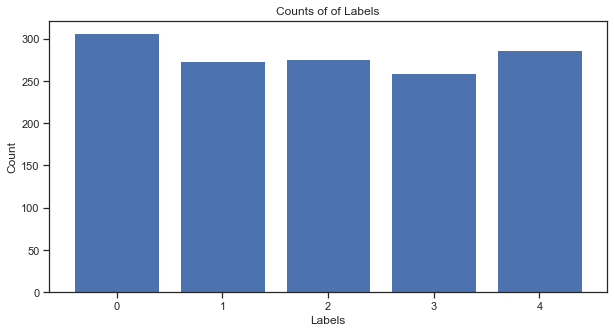

In [239]:
label_counts = df.iloc[:, 0].value_counts()

print(label_counts)

plt.figure(figsize=(10, 5))
plt.bar(label_counts.index, label_counts.values)
plt.xlabel('Labels')
plt.ylabel('Count')
plt.title('Counts of of Labels')
plt.show()

In this case we have all the labels with similar counts, so it is not a problem to be addressed.

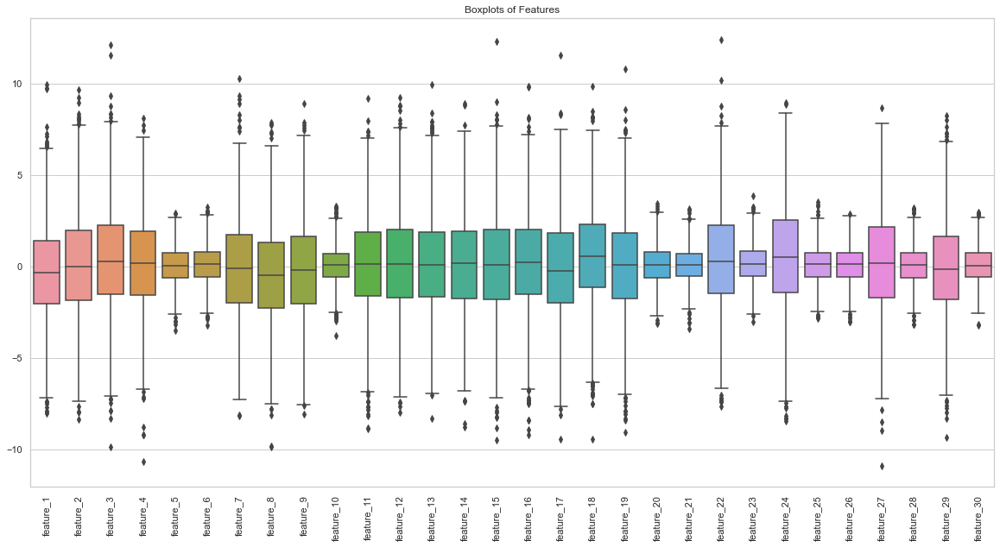

In [243]:
sns.set_theme(style="whitegrid")

plt.figure(figsize=(20, 10))
feature_columns = df.drop(columns=['label']).columns
sns.boxplot(data=df[feature_columns])
plt.xticks(rotation=90)
plt.title('Boxplots of Features')

plt.show()

There can be noticed many outliers samples, to address this, we compute 2 boundaries (lower and upper) in order to cut them off from the dataset. I do this since training models with outliers can bring to overfitting, or misclassification of data.

In [244]:
def calculate_boundaries(dataframe, column):
    q1 = dataframe[column].quantile(0.26)
    q3 = dataframe[column].quantile(0.74)
    interq = q3 - q1
    lower_boundary  = q1 - 1.5 * interq
    upper_boundary = q3 + 1.5 * interq
    return lower_boundary, upper_boundary

def filter_dataframe(dataframe, column, lower_bound, upper_bound):
    filtered_dataframe = dataframe.loc[(dataframe[column] > lower_bound) & (dataframe[column] < upper_bound)]
    return filtered_dataframe

df_reduced = df.copy()
feature_columns = df.drop(columns=['label']).columns
for feature in feature_columns:
        lower_boundary, upper_boundary = calculate_boundaries(df_reduced, feature)
        df_reduced = filter_dataframe(df_reduced, feature, lower_boundary, upper_boundary) 

In [245]:
print('Number of Samples:', df_reduced.shape[0])
print('Number of Features:', df_reduced.iloc[:,1:].shape[1])

Number of Samples: 949
Number of Features: 30


Around 450 samples were removed from the dataset, as we will see in the next plot the outliers disappeared.Moreover, This particular choice of outliers boundaries removes all the outliers and increases SVC performance.

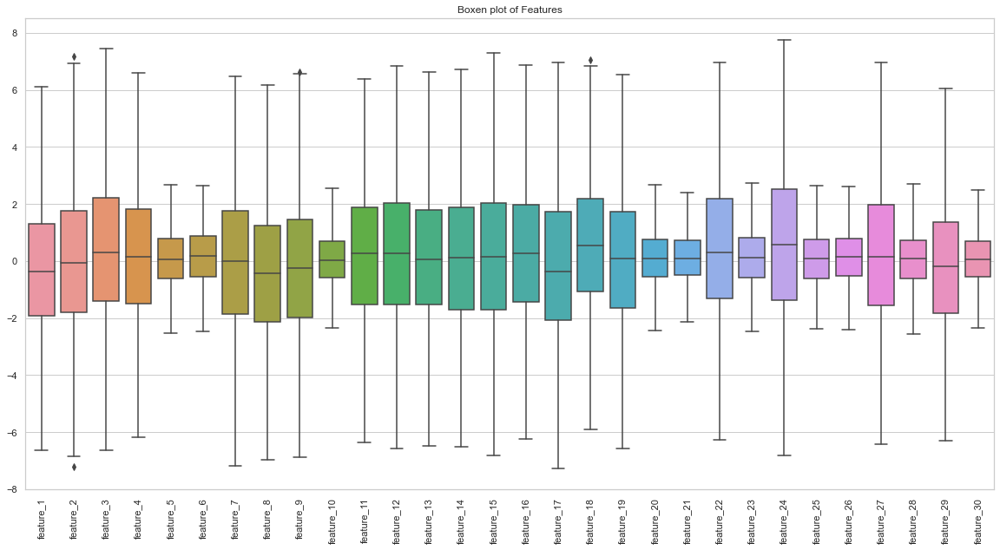

In [247]:
sns.set_theme(style="whitegrid")

plt.figure(figsize=(20, 10))
feature_columns = df_reduced.drop(columns=['label']).columns
sns.boxplot(data=df_reduced[feature_columns])
plt.xticks(rotation=90)
plt.title('Boxplot without outliers')

plt.show()

Check if proportions are mantained

0    217
4    194
2    190
3    175
1    173
Name: label, dtype: int64


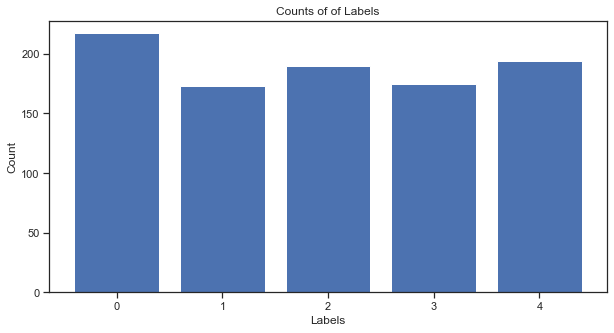

In [284]:
label_counts = df_reduced.iloc[:, 0].value_counts()

print(label_counts)

plt.figure(figsize=(10, 5))
plt.bar(label_counts.index, label_counts.values)
plt.xlabel('Labels')
plt.ylabel('Count')
plt.title('Counts of of Labels')
plt.show()

### Feature Analysis

Another problem could be a bad-distributed dataset, so now i check the distribution of all the features

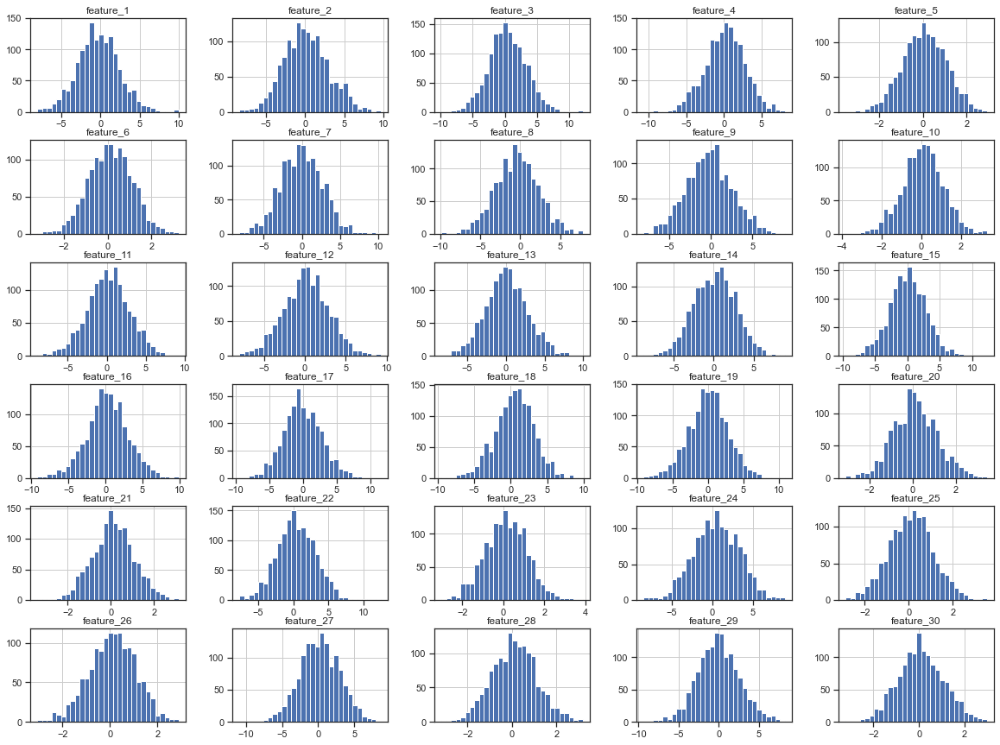

In [ ]:
df.iloc[:, 1:].hist(bins=30, figsize=(20, 15))
plt.show()



The presence of normal distributions in all features indicates that the data is likely to be representative and well-behaved. It suggests that there are no extreme outliers or major data quality issues skewing the distribution, so the dataset is symmetric, meaning that the mean, median, and mode are all approximately equal.

Now we want to understand dependency between features, we will use .corr() function to see if there are linear correlations between features, and then i use a grid of pairplots to check if there are other non-linear correlations.

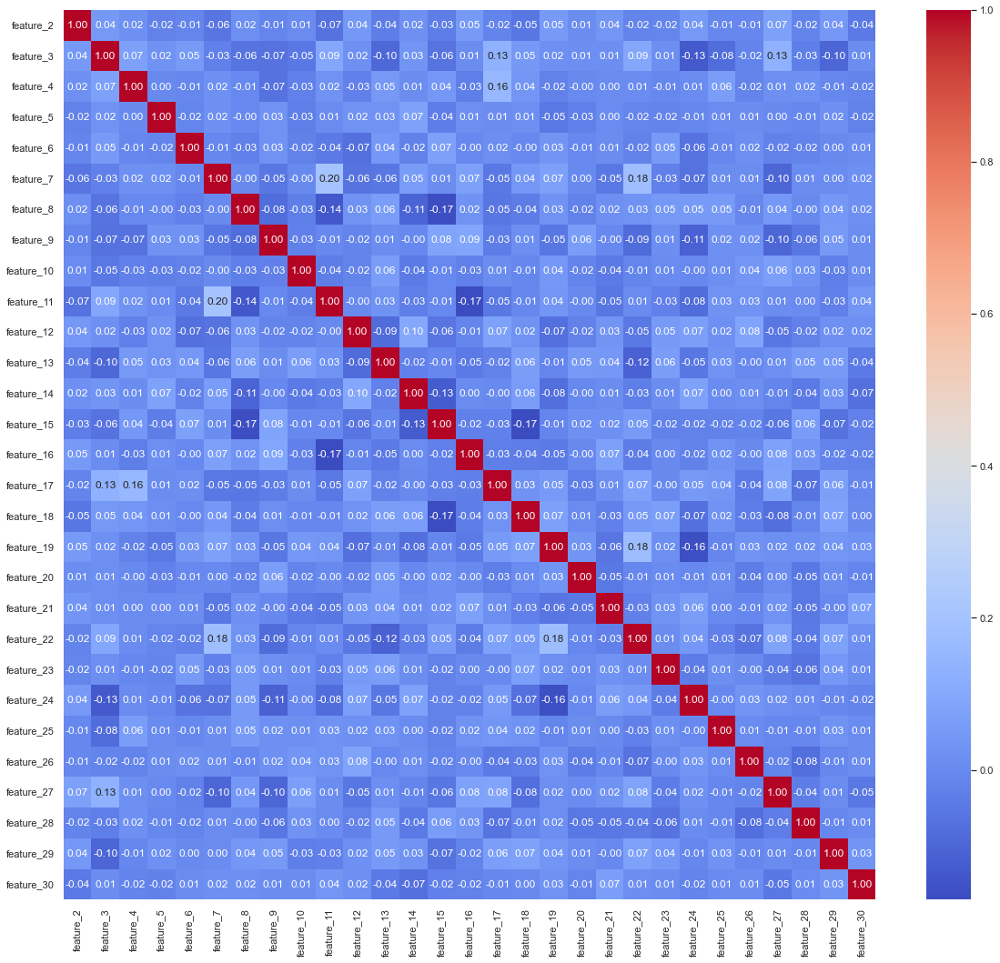

In [248]:

corr_matrix = df_reduced.iloc[:, 2:].corr()

# Plot the correlation matrix
plt.figure(figsize=(20, 18))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.show()

The correlation matrix reveals a weak linear relationship between non-identical features, with a maximal correlation coefficient of 0.20. This implies independence and unique information contribution from each feature. The weak correlation has implications for feature selection, suggesting the inclusion of both features for capturing different aspects of the data. However, it also suggests that linear models may not be the best fit, in fact as we will see, the LinearSVC model will preform worse than other non linear models on this dataset. In this case, using PCA to reduce to 0 linear correlation would not be helpful since removing features models would lose non linear inoformation that could worsen performance for a non linear classifier. 

Pairplot to see possible correlations in data 

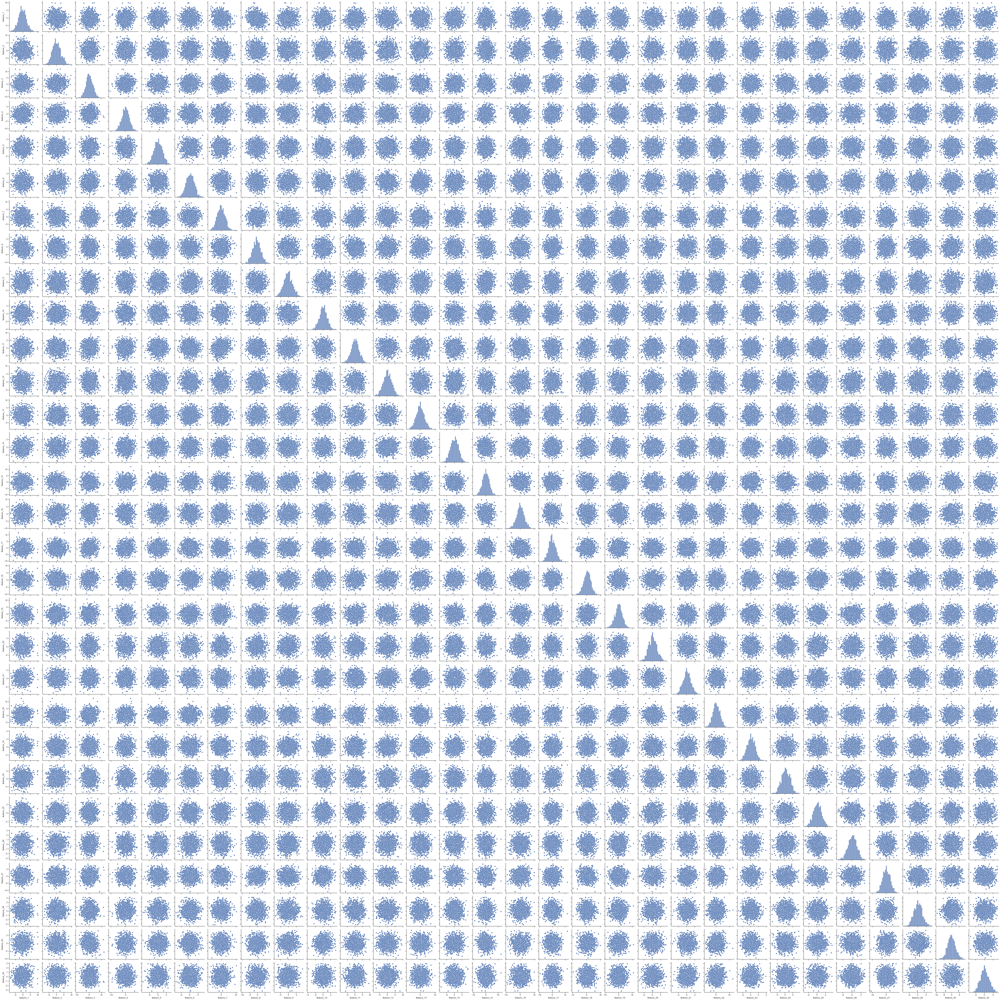

In [249]:
#runs in 10m 30s
sns.set_theme(style="ticks")

feature_columns = df_reduced.drop(columns=['label']).columns

sns.pairplot(df[feature_columns])

Even if it needed a long running time, this plot grid gives us an important information: features are totally uncorrelated between each others, in fact, in the next cells we can see that the two features captured by t-SNE reducer( a machine learning technique for visualizing high-dimensional data by reducing it to a low-dimensional space (2D or 3D), especially effective at maintaining local relationships, that in this case are inexistent) don't underline a particular cluster division.


 The next snippet uses DBSCAN that is a density-based clustering algorithm that identifies clusters as high-density regions separated by areas of low density, it doesn't require specifying the number of clusters and can discover clusters of arbitrary shape. Now we can see that there are no naturally separated clusters

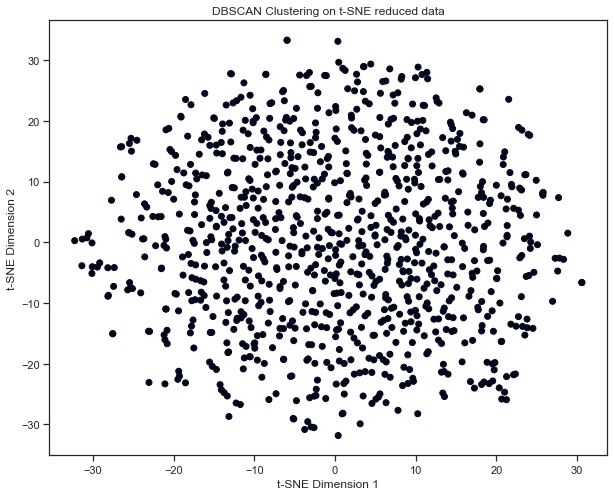

In [293]:

tsne = TSNE(n_components=2, random_state=0)
df_2d = tsne.fit_transform(df_reduced.iloc[:,1:])

dbscan = DBSCAN(eps=0.5)
clusters = dbscan.fit_predict(df_2d)

plt.figure(figsize=(10, 8))
plt.scatter(df_2d[:, 0], df_2d[:, 1], c=clusters)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.title("DBSCAN Clustering on t-SNE reduced data")
plt.show()

We notice that DBSCan doesnt find different clusters in this case, making it evident that the first 2 t-SNE dimension cannot catch the 5 labels of the dataset, we will try this label plotting the data against the 2 most relevant features according to Random Forest. For what concerns this analysis, we don't know yet a specific relation between features on labels, and features on features.

# CLASSIFIERS

We construct Train and Test with both reduced and full dataset to see if there is a difference in accuracy scores.

In [250]:
Xr = df_reduced.iloc[:,1:]
yr = df_reduced.iloc[:, 0]  


Xr_train, Xr_test, yr_train, yr_test = train_test_split(Xr, yr, test_size=0.20, random_state=42)

In [251]:
X = df.iloc[:,1:]
y = df.iloc[:, 0]  


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)


It is a good practise (sometimes mandatory) to scale datasets in order to fit some classifiers. This is the case for LinearSVC(); MinMaxScaler was the best one in terms of future accuracies.

In [252]:

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [253]:

scaler = MinMaxScaler()
Xr_train_scaled = scaler.fit_transform(Xr_train)
Xr_test_scaled = scaler.transform(Xr_test)


### SVM

In [255]:

svc = LinearSVC(random_state=98, C = 1)

We try the default classifier on the full scaled dataset and then on the reduced one (without outliers)

In [256]:

svc.fit(X_train_scaled, y_train)

svc_pred = svc.predict(X_test_scaled)

svc_acc = accuracy_score(y_test, svc_pred)

precision = precision_score(y_test, svc_pred, average='weighted')
recall = recall_score(y_test, svc_pred, average='weighted')
f1 = f1_score(y_test, svc_pred, average='weighted')

print(f'SVC scaled without tuning on test: {svc_acc}')
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1)

SVC scaled without tuning on test: 0.475
Precision:  0.47260164840784424
Recall:  0.475
F1 Score:  0.4716723953192758


In [257]:

svc.fit(Xr_train_scaled, yr_train)

svc_pred = svc.predict(Xr_test_scaled)

svc_acc = accuracy_score(yr_test, svc_pred)

precision = precision_score(yr_test, svc_pred, average='weighted')
recall = recall_score(yr_test, svc_pred, average='weighted')
f1 = f1_score(yr_test, svc_pred, average='weighted')

print(f'SVC without tuning on test reduced: {svc_acc}')
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1)


SVC without tuning on test reduced: 0.5052631578947369
Precision:  0.5033527170706601
Recall:  0.5052631578947369
F1 Score:  0.4936976195262969


It can be noticed that our outlier detection and removal had a positive effect on accuracy, so we will continue with df_reduced for this classifier. Moreover, scaling slightly increases accuracy on the test set, moreover it can improve the model's performance on unseen data. This is because many algorithms, including SVM, perform better when all features are on the same scale, as it prevents them from overemphasizing features with larger scales. Therefore, despite a minor decrease in accuracy, scaling is a crucial step to ensure the model generalizes well to new data. So for LinearSVC i will continue with the scaled X train and test sets.

Now we rapidly check if the model overfits on the train (very high accuracy compared to test set)

In [258]:
#Check if we are overfitting
svc_pred = svc.predict(X_train_scaled)
svc_acc = accuracy_score(y_train, svc_pred)
print(f'SVC without tuning on train: {svc_acc}')

SVC without tuning on train: 0.46339285714285716


In [259]:

svc_pred = svc.predict(Xr_train_scaled)
svc_acc = accuracy_score(yr_train, svc_pred)
print(f'SVC without tuning on train: {svc_acc}')

SVC without tuning on train: 0.5125164690382081


This is not the case, since the performance on train set is slightly better, then this means tha the model doesn't learn perfectly how to classify the train set, then its performance won't decrease so much on unseen data.

Now we try to tune hyperparameters of the model in order to improve accuracy, or as we will see, to check if the default parameters of the function already fit our dataset.
We will try RandomizedSearch and GridSearch that use both a cross validation split of 5 splits on our dataset. Grid search performs better but Randomized search can find the same result if the number of iterations is sufficiently high. It is useful to compare them in case we can find a good number of iterations of Randomized search, in a way that it finds same parameters of Grid search ( optimal ones) but in less amount of time.

The most important value C is inspected singularly since can cause very slow running times for Grid and Random search. We will use learning curve function to visualize how parameter 'C' can change accuracy of the predictions

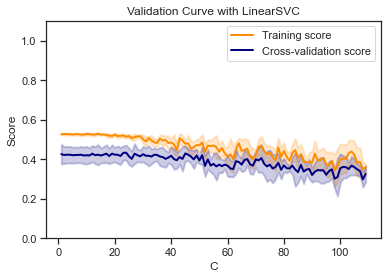

In [279]:

from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np
from sklearn.svm import LinearSVC
from sklearn.model_selection import validation_curve

param_range = np.arange(1, 110)
train_scores, test_scores = validation_curve(
    LinearSVC(random_state = 98),
    Xr_train_scaled,
    yr_train,
    param_name="C",
    param_range=param_range,
    scoring="accuracy",
    n_jobs=-1,
)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.title("Validation Curve with LinearSVC")
plt.xlabel("C")
plt.ylabel("Score")
plt.ylim(0.0, 1.1)
lw = 2
plt.plot(param_range, train_scores_mean, label="Training score", color="darkorange", lw=lw)
plt.fill_between(param_range, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color="darkorange", lw=lw)
plt.plot(param_range, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)
plt.fill_between(param_range, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.2, color="navy", lw=lw)
plt.legend(loc="best")
plt.show()


We will keep C fixed as the accuracy of the model decreases as it increases.

In [260]:
#hyperparameter tuning
svc_params = {
    'loss': ['hinge', 'squared_hinge'],
    'penalty': ['l1', 'l2'],
    'dual': [True, False],
    'tol': [1e-6, 1e-5, 1e-4, 1e-3, 1e-2],
    'class_weight': [None, 'balanced'],
    'multi_class': ['ovr', 'crammer_singer']
  
  
}



Grid search

In [261]:
svc_gs= GridSearchCV(svc, svc_params, cv=5, n_jobs = -1)

svc_gs.fit(Xr_train_scaled, yr_train)


svc_par_gs = svc_gs.best_params_


print(f'SVC Best Parameters: {svc_par_gs}')



c:\Users\hp\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
200 fits failed out of a total of 800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
50 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\hp\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\hp\anaconda3\lib\site-packages\sklearn\svm\_classes.py", line 274, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "c:\Users\hp\anaconda3\lib\site-packages\sklearn\svm\_base.py", line 1223, in _fit_liblinear
    solver_type = _get_liblinear_solver_type(multi_class, penalt

SVC Best Parameters: {'class_weight': 'balanced', 'dual': False, 'loss': 'squared_hinge', 'multi_class': 'ovr', 'penalty': 'l1', 'tol': 0.0001}


c:\Users\hp\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [262]:
#Grid search accuracy
svc.set_params(**svc_par_gs)

svc.fit(Xr_train_scaled, yr_train)

svc_gs_pred = svc.predict(Xr_test_scaled)
svc_gs_acc = accuracy_score(yr_test, svc_gs_pred)
print(f'SVC Accuracy with Grid Search tuning: {svc_gs_acc}')
precision = precision_score(yr_test, svc_gs_pred, average='weighted')
recall = recall_score(yr_test, svc_gs_pred, average='weighted')
f1 = f1_score(yr_test, svc_gs_pred, average='weighted')

print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1)


SVC Accuracy with Grid Search tuning: 0.5
Precision:  0.5038858253059705
Recall:  0.5
F1 Score:  0.4952967605506528


c:\Users\hp\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Grid search doesn't give us better parameters, we will try also randomized search but we expect the smae results

Randomized search 

In [263]:

svc_rs = RandomizedSearchCV(svc, svc_params, n_iter=300, cv=5, n_jobs = -1 , random_state= 42)

svc_rs.fit(Xr_train_scaled, yr_train)

svc_par_rs = svc_rs.best_params_

print(f'SVC Best Parameters: {svc_par_rs}')

c:\Users\hp\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:305: UserWarning: The total space of parameters 160 is smaller than n_iter=300. Running 160 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
c:\Users\hp\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
200 fits failed out of a total of 800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
50 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\hp\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\hp\anaconda3\lib\site-packages\sklearn\svm\_classes.py", l

SVC Best Parameters: {'tol': 0.0001, 'penalty': 'l1', 'multi_class': 'ovr', 'loss': 'squared_hinge', 'dual': False, 'class_weight': 'balanced'}


c:\Users\hp\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [264]:
#random search accuracy
svc.set_params(**svc_par_rs)
svc.fit(Xr_train_scaled, yr_train)

svc_rs_pred = svc.predict(Xr_test_scaled)
svc_rs_acc = accuracy_score(yr_test, svc_rs_pred)
print(f'SVC Accuracy with Random Search tuning: {svc_rs_acc}')

SVC Accuracy with Random Search tuning: 0.5


c:\Users\hp\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


After this tuning, i found out that the highest performance is reached by the default parameters, so i will keep them


In [280]:
svc_par_final = svc.get_params()
svc_par_final

{'C': 1.0,
 'class_weight': None,
 'dual': True,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'loss': 'squared_hinge',
 'max_iter': 1000,
 'multi_class': 'ovr',
 'penalty': 'l2',
 'random_state': 98,
 'tol': 0.0001,
 'verbose': 0}

The ROC curve is a graphical representation of the contrast between true positive rates and the false positive rate at various thresholds. It's often used as a proxy for the trade-off between the sensitivity of the model (true positives) against the fall-out or the probability it will trigger a false alarm (false positives).

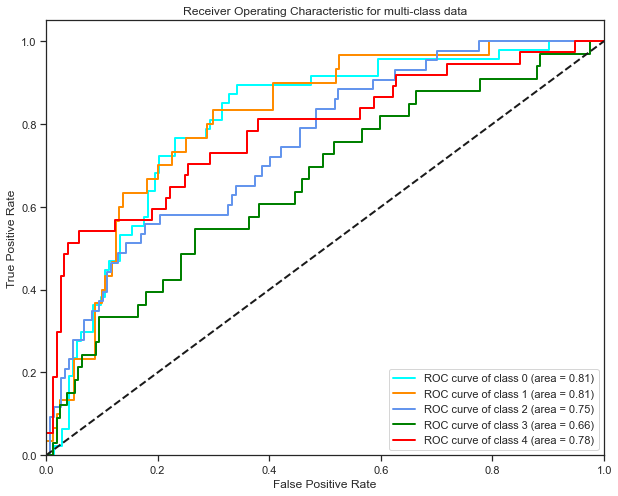

In [281]:
n_classes = 5

# Learn to predict each class against the other
classifier = OneVsRestClassifier(svc) # replace with your classifier
y_score = classifier.fit(Xr_train_scaled, yr_train).decision_function(Xr_test_scaled)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(yr_test == i, y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10,8))
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

The Area Under the Curve (AUC) values you have for each class represent the ability of your model to distinguish each class from the others.
Why this discrepancy between LinearSVC accuracy and AUC scores ?  AUC is typically used in binary classification problems,in a multi-class problem, the AUC for each class is calculated in a one-vs-all manner, which might not reflect the overall performance of the model accurately.

The last plot we use is -confusion matrix, in order to see if our model predictions do not follow the proportions of the labels of the primary dataset.

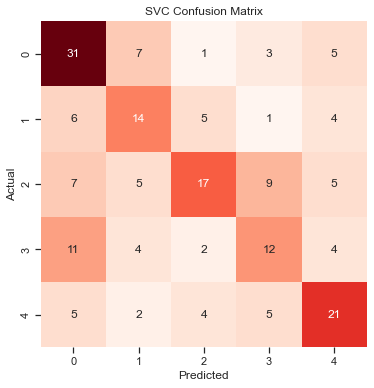

In [282]:

svc_cm = confusion_matrix(yr_test, svc_rs_pred)


plt.figure(figsize=(10, 6))
sns.heatmap(svc_cm, annot=True, fmt='d', cmap='Reds', cbar=False, square=True)

plt.title('SVC Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

Proportions are respected, in fact the label that has most samples inside it, is always "0" the most frequent label.

### Random Forest

In [285]:
rf = RandomForestClassifier(n_estimators=250, random_state=72)

We follow the same procedure as with LinearSVC(); however, this classifier doesn't need scaling.

In [171]:

rf.fit(X_train, y_train)
rf_pred= rf.predict(X_test)
rf_acc = accuracy_score(y_test, rf_pred)

precision = precision_score(y_test, rf_pred, average='weighted')
recall = recall_score(y_test, rf_pred, average='weighted')
f1 = f1_score(y_test, rf_pred, average='weighted')

print("Accuracy:" , rf_acc)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1)



Accuracy: 0.5642857142857143
Precision:  0.5611931717131297
Recall:  0.5642857142857143
F1 Score:  0.5612863323044769


In [170]:
rf = RandomForestClassifier(n_estimators=250, random_state=72)
rf.fit(Xr_train, yr_train)
rf_pred= rf.predict(Xr_test)
rf_acc = accuracy_score(yr_test, rf_pred)

precision = precision_score(yr_test, rf_pred, average='weighted')
recall = recall_score(yr_test, rf_pred, average='weighted')
f1 = f1_score(yr_test, rf_pred, average='weighted')

print("Accuracy:" , rf_acc)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1)



Accuracy: 0.5631578947368421
Precision:  0.5569530176677842
Recall:  0.5631578947368421
F1 Score:  0.5524984612437805


Here the accuracy slightly decreases using reduced dataset(about 0.001) but we accept this in the view of a most probable generalization better performance.

Now we check overfitting and try to solve it.

In [169]:
rf.fit(Xr_train, yr_train)
rf_pred= rf.predict(Xr_train)
rf_acc_t = accuracy_score(yr_train, rf_pred)

precision = precision_score(yr_train, rf_pred, average='weighted')
recall = recall_score(yr_train, rf_pred, average='weighted')
f1 = f1_score(yr_train, rf_pred, average='weighted')

print("Accuracy:" , rf_acc_t)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1)

Accuracy: 1.0
Precision:  1.0
Recall:  1.0
F1 Score:  1.0


It overfits! We now will search for a 'max depth' for trees of the random forest, in a way to decrease the less as possible the accuracy, but at the same time decrease the accuracy on train (surely we don't want accuracy 100% on train set, since it indicates the models learns too good how to classify taining set but it doesn't generalize well).

Now i try to tune the parameters hoping that this process will incerease accuracy.

In [104]:
rf_params = {
    'n_estimators': range(100,501,50),  
    'max_depth': range(10,15),
    'class_weight': [None, 'balanced', 'balanced_subsample'], 
    'criterion': ['gini', 'entropy'], 
}

In [105]:
#RandomizedSerch for rf

rf_rs = RandomizedSearchCV(rf, rf_params, n_iter=100, cv=5, n_jobs = -1 )
rf_rs.fit(Xr_train, yr_train)
rf_par_rs = rf_rs.best_params_
print(f'Random Forest Best Parameters: {rf_par_rs}')

Random Forest Best Parameters: {'n_estimators': 450, 'max_depth': 10, 'criterion': 'entropy', 'class_weight': None}


In [118]:
rf.set_params(**rf_par_rs)
rf.fit(Xr_train, yr_train)
rf_rs_pred= rf.predict(Xr_test)
rf_acc = accuracy_score(yr_test, rf_rs_pred)
print(f'RF Accuracy with Randomized Search (100 iter) tuning: {rf_acc}')

RF Accuracy with Randomized Search (100 iter) tuning: 0.5368421052631579


In [119]:
rf.fit(Xr_train, yr_train)
rf_pred= rf.predict(Xr_train)
rf_acc = accuracy_score(yr_train, rf_pred)

precision = precision_score(yr_train, rf_pred, average='weighted')
recall = recall_score(yr_train, rf_pred, average='weighted')
f1 = f1_score(yr_train, rf_pred, average='weighted')

print("Accuracy:" , rf_acc)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1)

Accuracy: 1.0
Precision:  1.0
Recall:  1.0
F1 Score:  1.0


We got again 1.0, so it is reasonable to avoid decrease max depth, since the model learns perfectly how to label the train set anyway.

Now we try to tune random_state in order to increase accuracy.

Best random state: 72
Best accuracy: 0.5821428571428572


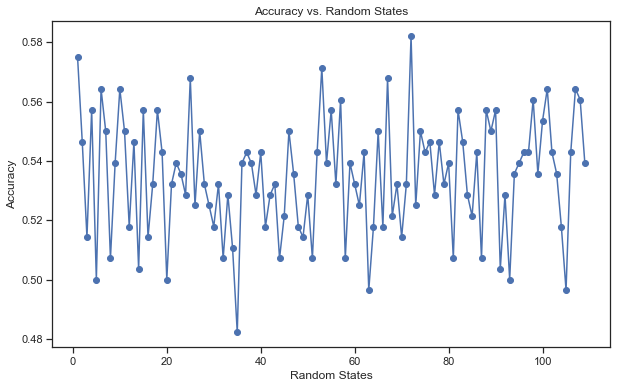

In [25]:
#Accuracy vs random states
accuracies = []


rand_states = list(range(1, 110))
best_accuracy = -1
for n in rand_states:
    rf.fit(Xr_train, yr_train)
    
    # Make predictions and calculate accuracy
    y_pred = rf.predict(Xr_test)
    accuracy = accuracy_score(yr_test, y_pred)
    
    # Store the accuracy
    accuracies.append(accuracy)
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_random_state = n

print(f"Best random state: {best_random_state}")
print(f"Best accuracy: {best_accuracy}")
# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(rand_states, accuracies, marker='o')
plt.title('Accuracy vs. Random States')
plt.xlabel('Random States')
plt.ylabel('Accuracy')
plt.show()

During model development, we adjusted the random_state parameter to maximize accuracy. This parameter controls the seed for random processes in the algorithm, affecting our model's performance on this specific dataset. However, this optimal random_state may not yield the same performance on new data, as it's tied to our current dataset and the inherent randomness of the learning algorithm. Therefore, while it improved our model's current performance, it's generally more effective to focus on tuning model parameters and validating performance across multiple random_state values for robustness. In this case tuning other parameters wasn't that effective.

Now that we got the tuned random forest, we can plot a tree and make some conclusion about the model and the fitting on the dataset

In [172]:
rf = RandomForestClassifier(n_estimators=250, random_state=72)
rf.fit(Xr_train, yr_train)
rf_pred= rf.predict(Xr_test)
rf_acc = accuracy_score(yr_test, rf_pred)
print(accuracy)

0.5631578947368421


In [173]:
importances = rf.feature_importances_

# Sort the features by importance
sorted_indices = np.argsort(importances)[::-1]
print('Top 5 features:')
for index in sorted_indices[:5]:
    print(f"{X_train.columns[index]}: {importances[index]}")

Top 5 features:
feature_15: 0.051052688436292064
feature_9: 0.04657732472190714
feature_22: 0.04456352463387658
feature_27: 0.04266716513162896
feature_12: 0.039487934747435116


We try again to plot datapoints with features as axes: even if again DBSCAN doesn't divide data points in differnt clusters, there is an apparent "star" split of the dataset, that i can interpret as the 5 labels (unfortunately the two most relevant features have importance 0.051 and 0.046 that are not high enough to identify clearly the labels)

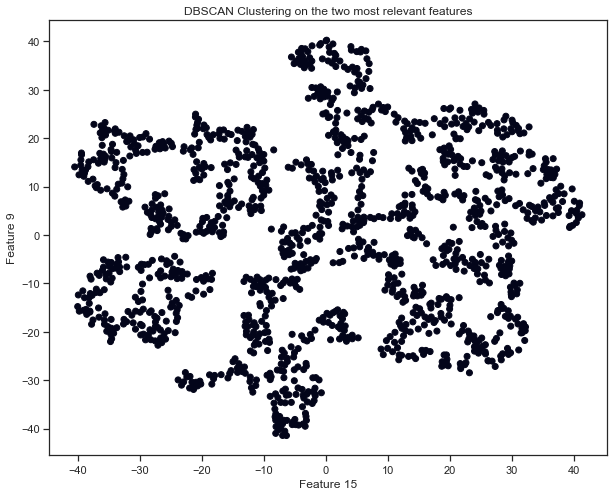

In [294]:

top_features = df[[X_train.columns[sorted_indices[0]], X_train.columns[sorted_indices[1]]]]

top2_features = tsne.fit_transform(top_features)
dbscan = DBSCAN(eps=0.03, min_samples=3)
clusters = dbscan.fit_predict(top2_features)

plt.figure(figsize=(10, 8)) 
plt.scatter(top2_features[:, 0], top2_features[:, 1], c=clusters)
plt.xlabel("Feature 15")
plt.ylabel("Feature 9")
plt.title("DBSCAN Clustering on the two most relevant features")
plt.show()


Again we check the proportion of the predicted lables, for this classifier too, the predictions follo the original split.

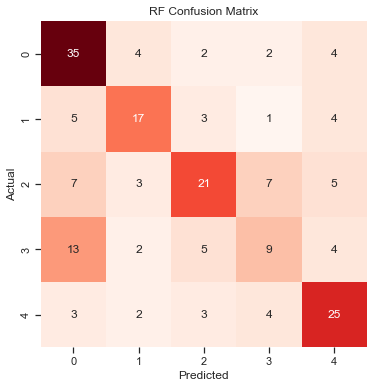

In [175]:
rf_cm = confusion_matrix(yr_test, rf_pred)

plt.figure(figsize=(10, 6))
sns.heatmap(rf_cm, annot=True, fmt='d', cmap='Reds', cbar=False, square=True)

plt.title('RF Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()


Now we check which is the most accurarte model between the two assigned ones:

In [295]:

best_model1 = svc if svc_acc > rf_acc else rf
print(f'Best Model: {best_model1}')
print(f'Best Model: {best_model1.get_params()}')

Best Model: RandomForestClassifier(n_estimators=250, random_state=72)
Best Model: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 250, 'n_jobs': None, 'oob_score': False, 'random_state': 72, 'verbose': 0, 'warm_start': False}


For the assignment this would be enough but i want to increase performance of the predictions with a multilayer perceptron that i think fits better the dataset with respect to LinearSVC() and RandomForest() classifiers.

### MLP

We can try this model and see that it gets a very high accuracy on our validation set. I also added the confusion matrix as beore and a loss curve.

In [299]:

mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=60, alpha=1e-4,
                    solver='sgd', verbose=10, random_state=20,
                    learning_rate_init=.1)


mlp.fit(Xr_train, yr_train)

mlp_pred = mlp.predict(Xr_test)
mlp_acc = accuracy_score(yr_test, mlp_pred)
precision = precision_score(yr_test, mlp_pred, average='weighted')
recall = recall_score(yr_test, mlp_pred, average='weighted')
f1 = f1_score(yr_test, mlp_pred, average='weighted')


print(classification_report(yr_test, mlp_pred))
print(f'MLP without tuning on test: {mlp_acc}')
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1)


Iteration 1, loss = 1.80133815
Iteration 2, loss = 1.23778398
Iteration 3, loss = 1.03299538
Iteration 4, loss = 0.86080984
Iteration 5, loss = 0.71358290
Iteration 6, loss = 0.58895564
Iteration 7, loss = 0.49780978
Iteration 8, loss = 0.41511158
Iteration 9, loss = 0.34654575
Iteration 10, loss = 0.29382929
Iteration 11, loss = 0.24143493
Iteration 12, loss = 0.19822292
Iteration 13, loss = 0.16449704
Iteration 14, loss = 0.13510990
Iteration 15, loss = 0.11346065
Iteration 16, loss = 0.09550266
Iteration 17, loss = 0.08164085
Iteration 18, loss = 0.07097852
Iteration 19, loss = 0.06149096
Iteration 20, loss = 0.05388924
Iteration 21, loss = 0.04843660
Iteration 22, loss = 0.04312213
Iteration 23, loss = 0.03895518
Iteration 24, loss = 0.03556799
Iteration 25, loss = 0.03274398
Iteration 26, loss = 0.03033968
Iteration 27, loss = 0.02797035
Iteration 28, loss = 0.02605062
Iteration 29, loss = 0.02443595
Iteration 30, loss = 0.02304173
Iteration 31, loss = 0.02170850
Iteration 32, los

c:\Users\hp\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (60) reached and the optimization hasn't converged yet.
  warnings.warn(


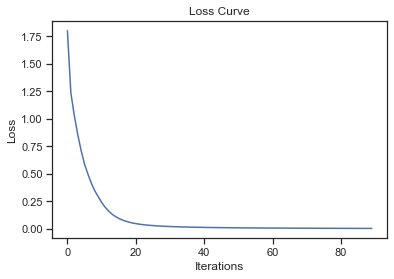

In [217]:
#Loss curve plot
plt.plot(mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

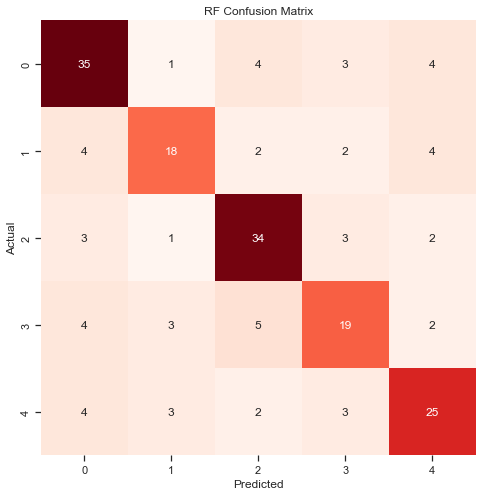

In [182]:
mlp_cm = confusion_matrix(yr_test, mlp_pred)

plt.figure(figsize=(15, 8))
sns.heatmap(mlp_cm, annot=True, fmt='d', cmap='Reds', cbar=False, square=True)

plt.title('RF Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

Here neither grid search works as wanted, we use the default MLP classifier with a good random seed.

# Final comparisons and predictions

We have compared the accuracies on the assigned models, RandomForest for this dataset results more accurate, even if it risks to not generalize well , because of the too high accuracy on training set. But we also found out that multilayer Perceptron achieves a better score than the other two classifiers(that anyway get almost 3 times the accuracy of a random choice of labels, that is not bad at all!), so for the final test predictions i will use this model.

In [296]:
mlp.get_params()

{'activation': 'relu',
 'alpha': 0.0001,
 'batch_size': 'auto',
 'beta_1': 0.9,
 'beta_2': 0.999,
 'early_stopping': False,
 'epsilon': 1e-08,
 'hidden_layer_sizes': (100,),
 'learning_rate': 'constant',
 'learning_rate_init': 0.1,
 'max_fun': 15000,
 'max_iter': 60,
 'momentum': 0.9,
 'n_iter_no_change': 10,
 'nesterovs_momentum': True,
 'power_t': 0.5,
 'random_state': 20,
 'shuffle': True,
 'solver': 'sgd',
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 10,
 'warm_start': False}

In [297]:
test_predictions= mlp.predict(test)

In [298]:
test_predictions

array([2, 2, 2, ..., 0, 0, 1], dtype=int64)